#Exercicios - Fundamentos Imagens

####Imagens: [lena gray 512](https://ead.bri.ifsp.edu.br/moodle/mod/resource/view.php?id=72337), [house](https://ead.bri.ifsp.edu.br/moodle/mod/resource/view.php?id=72342) e [cameraman](https://ead.bri.ifsp.edu.br/moodle/mod/resource/view.php?id=72339).

##1.Operação Ponto a ponto:

In [91]:
import numpy as np
from PIL import Image
from numpy import asarray
import matplotlib.pyplot as plt

def plot(img, imgNew, titulo):
  # Plot usando matplotlib
  fig, ax = plt.subplots(nrows=1, ncols=2)
  ax[0].imshow(img, cmap='gray')
  ax[0].set_title("Imagem original")
  ax[1].imshow(imgNew, cmap='gray')
  ax[1].set_title(titulo)
  plt.show()

In [92]:
#Abrir imagens
images = [Image.open('images/lena_gray_512.tif'),
             Image.open('images/house.tif'),
             Image.open('images/cameraman.tif')]

####1.1 - Calcular o negativo da imagem;

In [93]:
def negative(img):
  # Criar imagem negativa
  npImageNegative = np.array(img)
  npImageNegative = 255 - npImageNegative;

  imgNew = Image.fromarray(npImageNegative)
  return imgNew

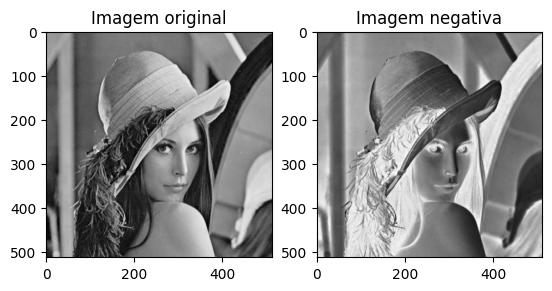

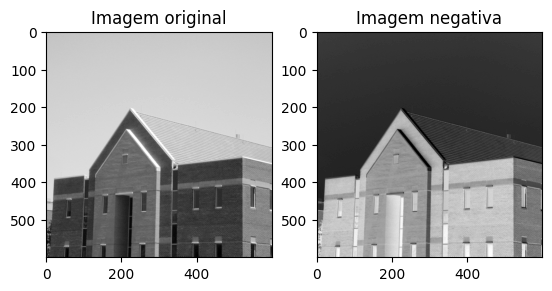

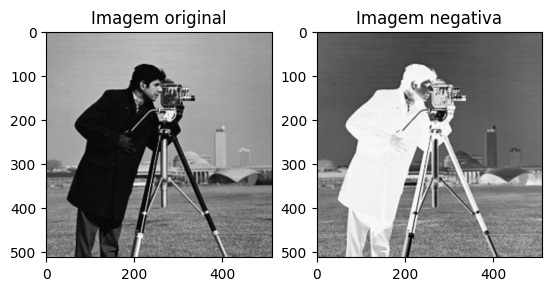

In [94]:
for img in images:
  imgNew = negative(img)
  plot(img,imgNew,"Imagem negativa")



---


####1.2 - Diminuir pela metade a intensidade dos pixels;




In [95]:
def intensity(img):
  # Criar imagem reduzida
  npImageRed = np.array(img)
  npImageRed = npImageRed/2;

  imgNew = Image.fromarray(npImageRed)
  return imgNew

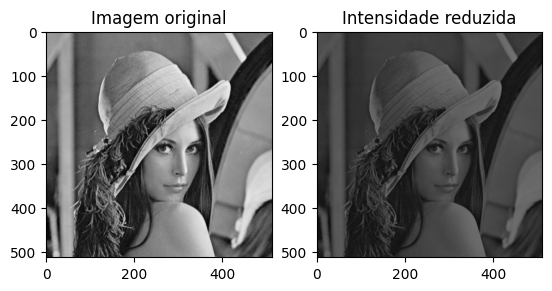

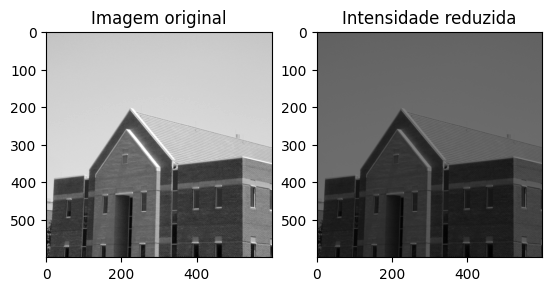

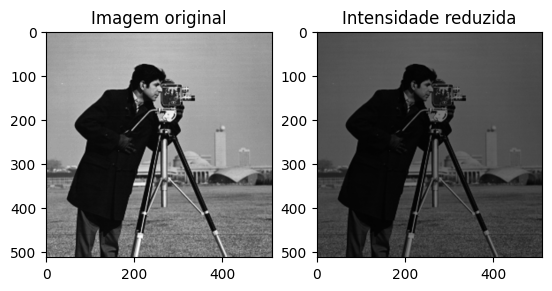

In [96]:
for img in images:
  imgNew = intensity(img)
  plot(img,imgNew,"Intensidade reduzida")



---


#### 1.3 - Incluir 4 quadrados brancos 10 x 10 pixels em cada canto das imagens;




In [97]:
def quad(img):
    #Criar quadrados
    npImageQuad = np.array(img)
    lin, col = npImageQuad.shape[:2]

    npImageQuad[0:10, 0:10] = 255
    npImageQuad[lin-10:lin, 0:10] = 255
    npImageQuad[0:10, col-10:col] = 255
    npImageQuad[lin-10:lin, col-10:col] = 255

    imgNew = Image.fromarray(npImageQuad)
    return imgNew

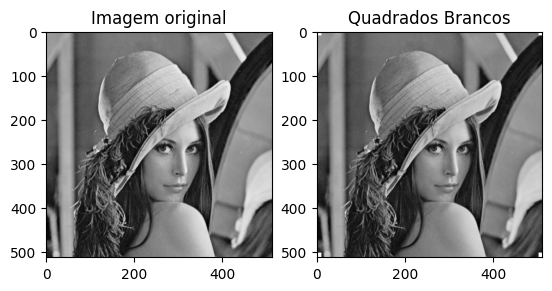

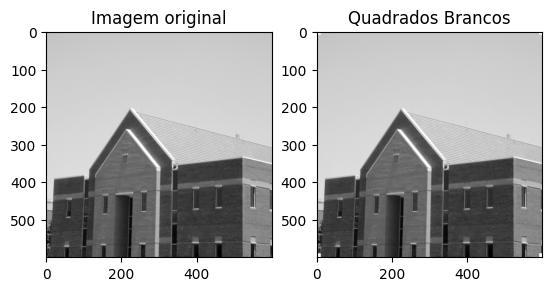

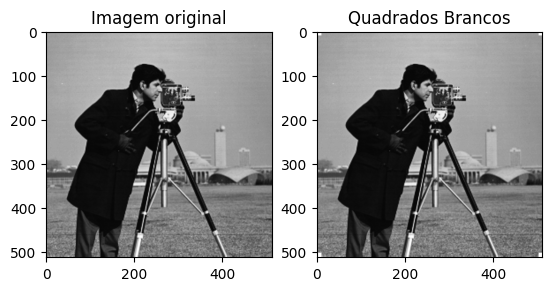

In [98]:
for img in images:
  imgNew = quad(img)
  plot(img,imgNew,"Quadrados Brancos")

---


#### 1.4 - Incluir 1 quadrado preto 15X15 no centro das imagens



In [99]:
def quadCentro(img):
    # Criar quadrado central
    npImage = np.array(img)
    lin, col = npImage.shape[:2]

    start_lin = (lin // 2) - 7
    start_col = (col // 2) - 7

    end_lin = start_lin + 15
    end_col = start_col + 15

    npImage[start_lin:end_lin, start_col:end_col] = 0

    imgNew = Image.fromarray(npImage)
    return imgNew

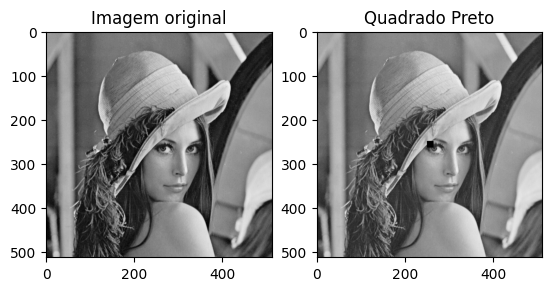

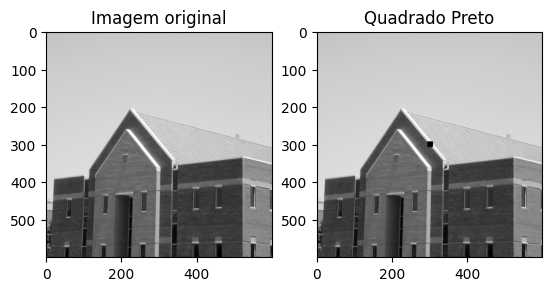

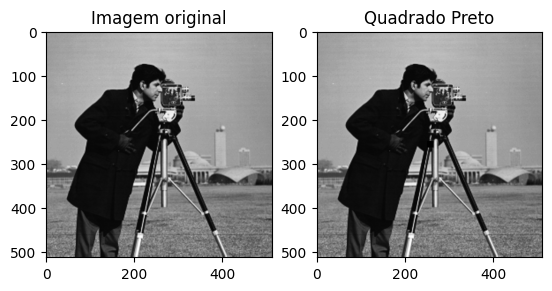

In [100]:
for img in images:
  imgNew = quadCentro(img)
  plot(img,imgNew,"Quadrado Preto")

##2.Operação por vizinhança:
###Utilizar kernel 3x3 pixels e desconsiderar pixels das extremidades. Para cada filtro implementar utilizando apenas numpy, utilizando pillow, utilizando opencv e utilizando scipy.

In [101]:
from PIL import ImageFilter
import cv2 as cv
import scipy

####2.1 - Calcular o filtro da média;

In [102]:
def filtroMedia(img, tam):
    #Calcular filtro da média
    npImage = np.array(img)
    imgFilter = np.empty(npImage.shape)
    lin, col = npImage.shape[:2]
    for x in range(1, lin - tam):
        for y in range(1, col - tam):
            w = npImage[x - 1:x + tam, y - 1:y + tam]
            imgFilter[x, y] = np.mean(w).astype(int)

    imgNew = Image.fromarray(imgFilter)
    return imgNew

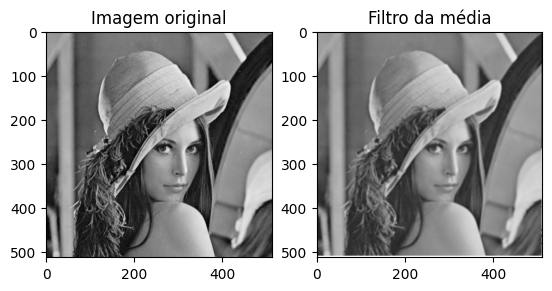

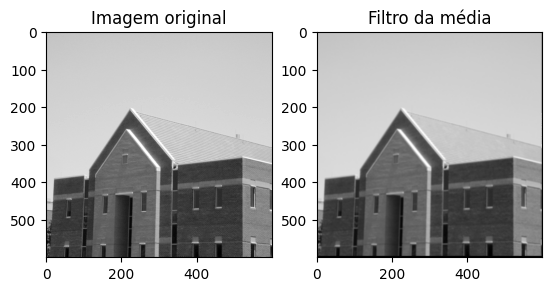

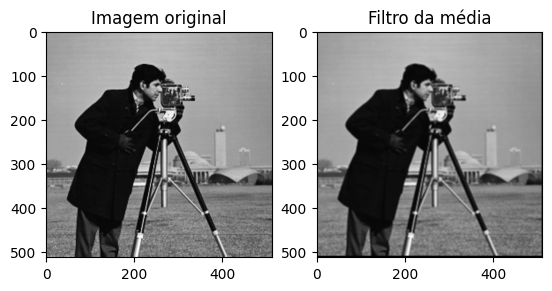

In [103]:
for img in images:
  imgNew = filtroMedia(img, 3)
  plot(img,imgNew,"Filtro da média")

#####Filtro Média usando Pillow

In [104]:
def filtroMediaPillow(img, tam):
    #Calcular filtro da média
    imgNew = img.filter(ImageFilter.BoxBlur(tam))
    return imgNew

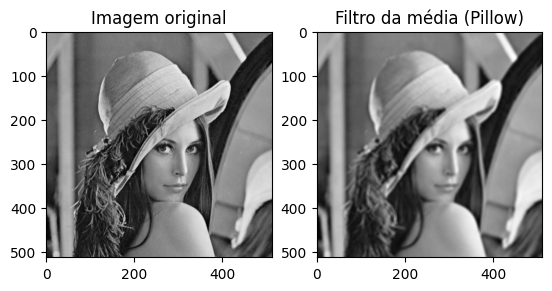

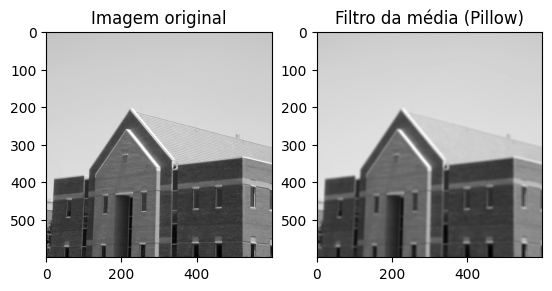

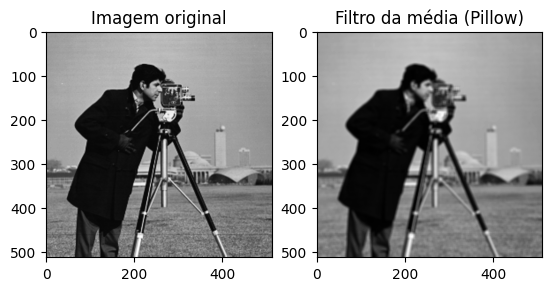

In [105]:
for img in images:
  imgNew = filtroMediaPillow(img, 3)
  plot(img,imgNew,"Filtro da média (Pillow)")

#####Filtro Média usando OpenCV

In [106]:
def filtroMediaOpenCV(img, tam):
    #Calcular filtro da média
    imgCV = cv.cvtColor(np.array(img), cv.COLOR_RGB2BGR)
    imgNew = cv.blur(imgCV,(tam,tam))
    return imgNew

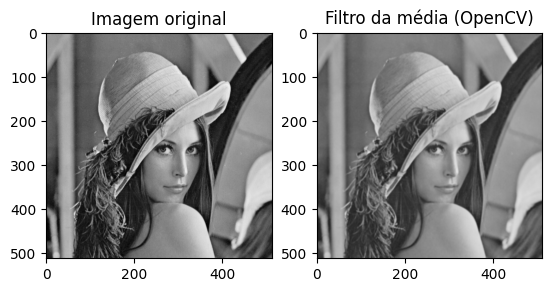

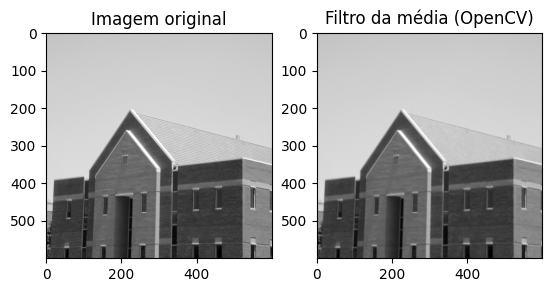

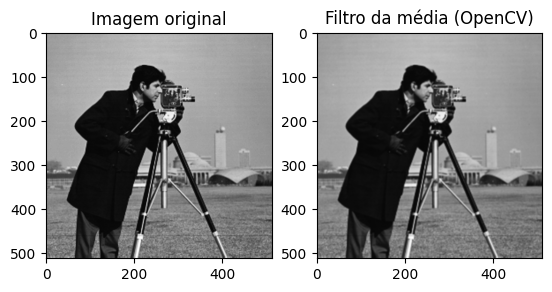

In [107]:
for img in images:
  imgNew = filtroMediaOpenCV(img, 3)
  plot(img,imgNew,"Filtro da média (OpenCV)")

#####Filtro Média usando Scipy

In [108]:
def filtroMediaScipy(img, tam):
    #Calcular filtro da média
    npImage = np.array(img)
    imgNew = scipy.ndimage.generic_filter(npImage,np.mean,tam)
    return imgNew

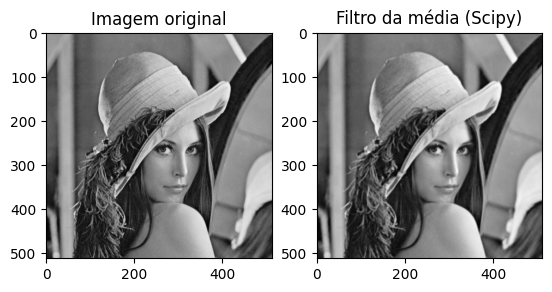

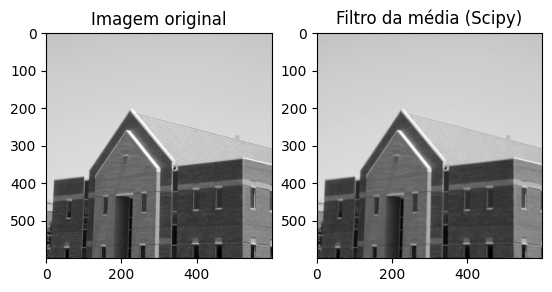

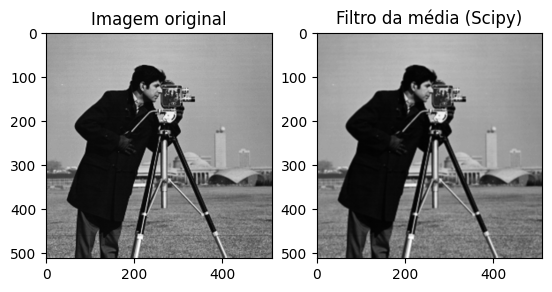

In [109]:
for img in images:
  imgNew = filtroMediaScipy(img, 3)
  plot(img,imgNew,"Filtro da média (Scipy)")

---


####2.2 - Calcular o filtro da mediana;

In [110]:
def filtroMediana(img):
    # Calcular filtro da mediana
    npImage = np.array(img)
    imgFilter = np.empty(npImage.shape)
    lin, col = npImage.shape[:2]
    for x in range(1, lin-2):
        for y in range (1, col-2):
            w = npImage[x-1:x+2 , y-1:y+2]
            imgFilter[x,y] = np.mean(w).astype(int)

    imgNew = Image.fromarray(imgFilter)
    return imgNew

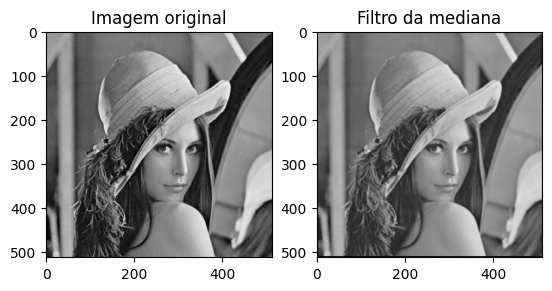

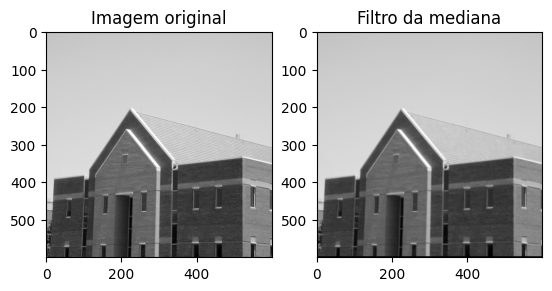

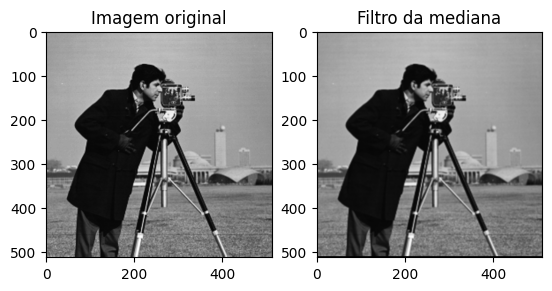

In [111]:
for img in images:
  imgNew = filtroMediana(img)
  plot(img,imgNew,"Filtro da mediana")

#####Filtro Mediana usando Pillow

In [112]:
def filtroMedianaPillow(img, tam):
    #Calcular filtro da média
    imgNew = img.filter(ImageFilter.MedianFilter(tam))
    return imgNew

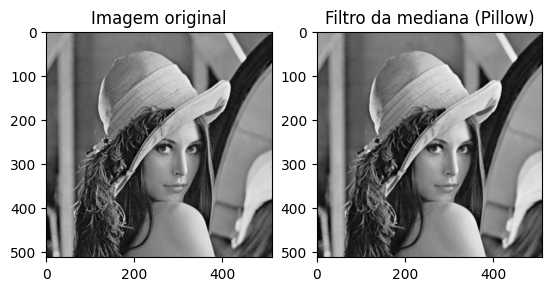

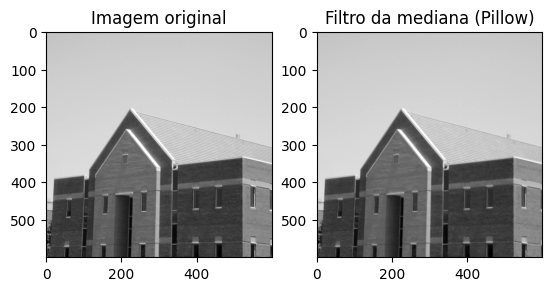

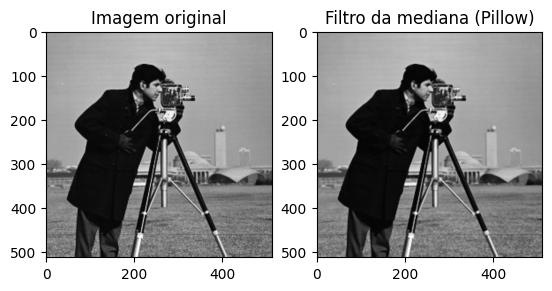

In [113]:
for img in images:
  imgNew = filtroMedianaPillow(img,3)
  plot(img,imgNew,"Filtro da mediana (Pillow)")

#####Filtro Mediana usando OpenCV

In [114]:
def filtroMedianaOpenCV(img, tam):
    #Calcular filtro da média
    imgCV = cv.cvtColor(np.array(img), cv.COLOR_RGB2BGR)
    imgNew = cv.medianBlur(imgCV,tam)
    return imgNew

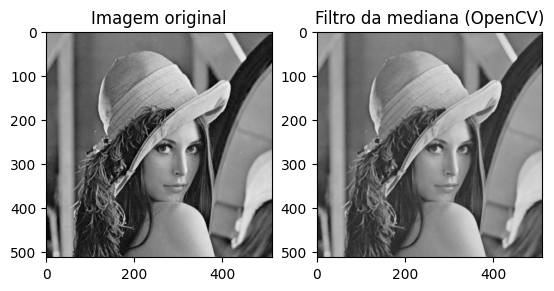

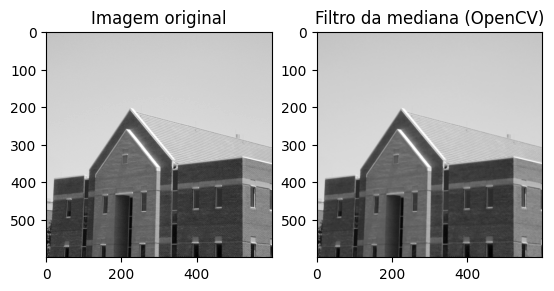

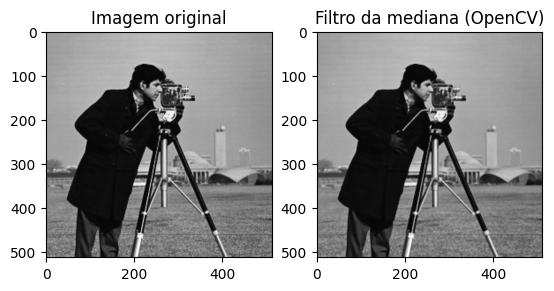

In [115]:
for img in images:
  imgNew = filtroMedianaOpenCV(img,3)
  plot(img,imgNew,"Filtro da mediana (OpenCV)")

#####Filtro Mediana usando Scipy

In [116]:
def filtroMedianaScipy(img, tam):
    #Calcular filtro da média
    npImage = np.array(img)
    imgNew = scipy.ndimage.generic_filter(npImage,np.median,tam)
    return imgNew

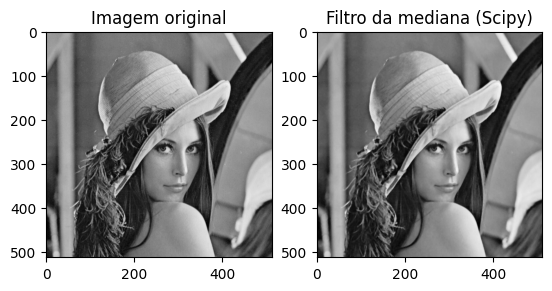

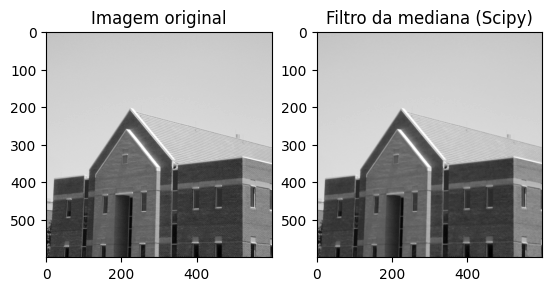

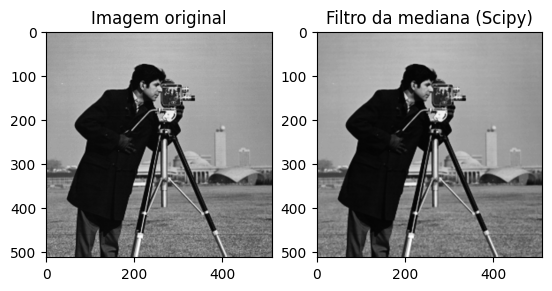

In [117]:
for img in images:
  imgNew = filtroMedianaScipy(img,3)
  plot(img,imgNew,"Filtro da mediana (Scipy)")

##3.Transformações geométricas:
###Para cada filtro implementar utilizando apenas numpy, utilizando pillow, utilizando opencv e utilizando scipy.

####3.1 - Escala: Redução em 1.5x e aumentar em 2.5x;

#####Escala usando Numpy

In [118]:
def escalaNumpy(img, escala):
    # Zoom usando Numpy
    npImage = np.array(img)
    lin, col = npImage.shape[:2]
    new_lin = int(lin * escala)
    new_col = int(col * escala)
    new_npImage = np.zeros((new_lin, new_col), dtype=npImage.dtype)

    for i in range(new_lin):
        for j in range(new_col):
            orig_i = int(i / escala)
            orig_j = int(j / escala)
            new_npImage[i, j] = npImage[orig_i, orig_j]

    imgNew = Image.fromarray(new_npImage)
    return imgNew

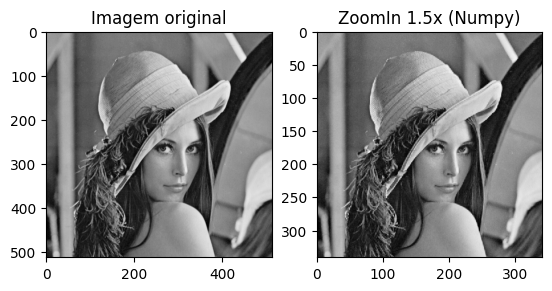

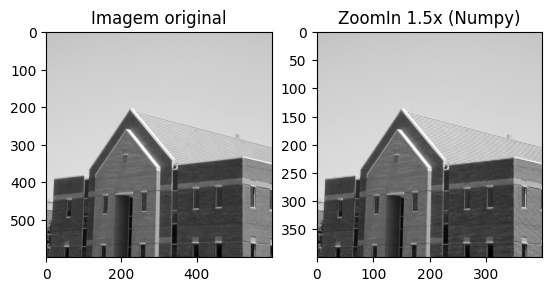

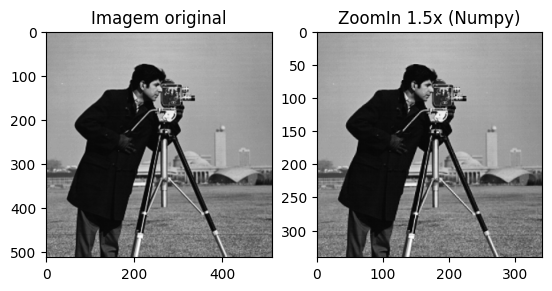

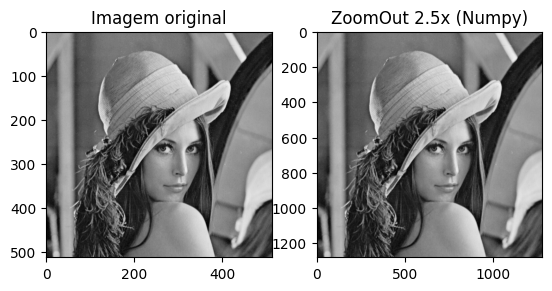

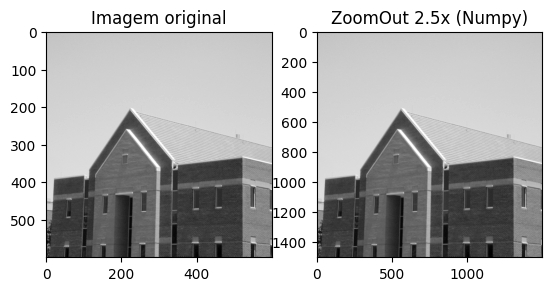

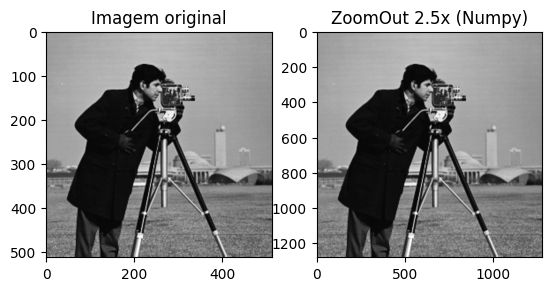

In [119]:
for img in images:
  imgNew = escalaNumpy(img, 2/3)
  plot(img,imgNew,"ZoomIn 1.5x (Numpy)")

for img in images:
  imgNew = escalaNumpy(img, 2.5)
  plot(img,imgNew,"ZoomOut 2.5x (Numpy)")

#####Escala usando Pillow

In [120]:
def escalaPillow(img, escala):
    # Zoom usando Pillow
    width, height = img.size
    new_width = int(width * escala)
    new_height = int(height * escala)

    img_resized = img.resize((new_width, new_height), Image.LANCZOS)
    return img_resized

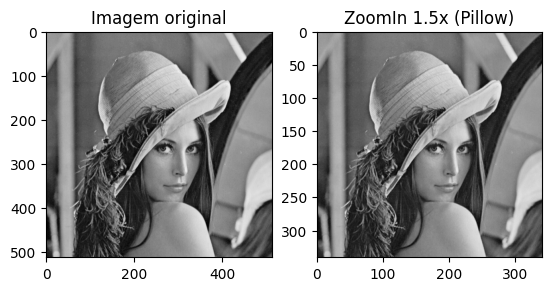

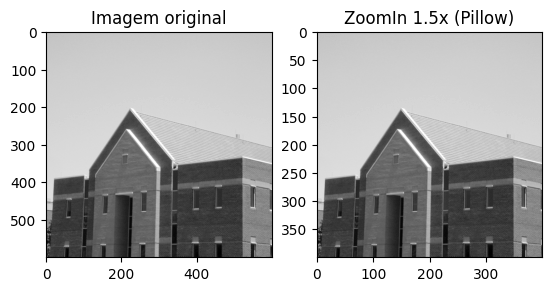

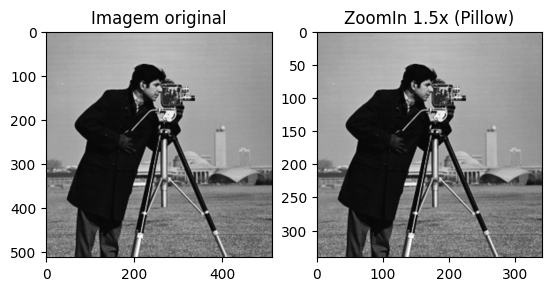

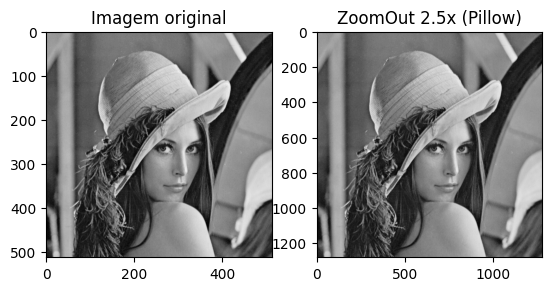

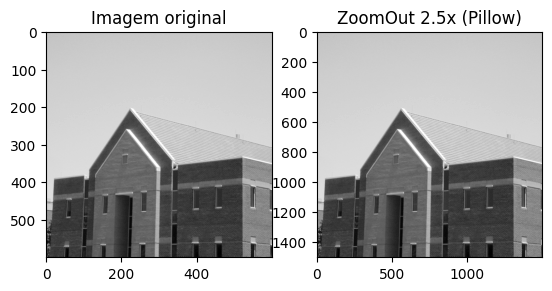

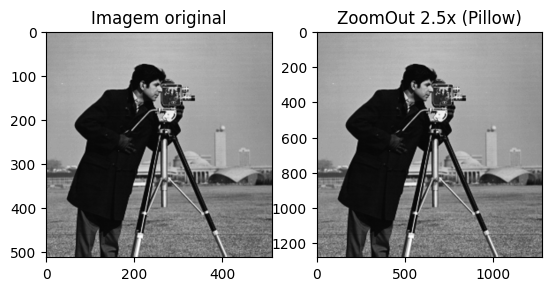

In [121]:
for img in images:
  imgNew = escalaPillow(img, 2/3)
  plot(img,imgNew,"ZoomIn 1.5x (Pillow)")

for img in images:
  imgNew = escalaPillow(img, 2.5)
  plot(img,imgNew,"ZoomOut 2.5x (Pillow)")

#####Escala usando OpenCV

In [122]:
def escalaOpenCV(img, escala):
    # Zoom usando OpenCV
    imgCV = cv.cvtColor(np.array(img), cv.COLOR_RGB2BGR)
    height, width = imgCV.shape[:2]
    new_width = int(width * escala)
    new_height = int(height * escala)

    img_resized = cv.resize( imgCV, (new_width, new_height), interpolation=cv.INTER_LANCZOS4)
    return img_resized

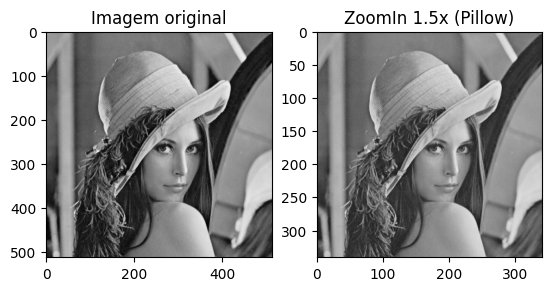

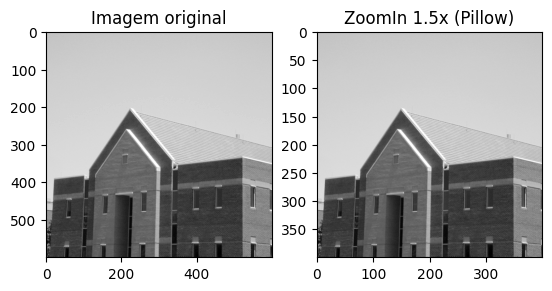

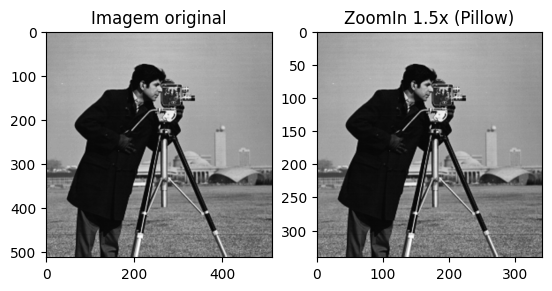

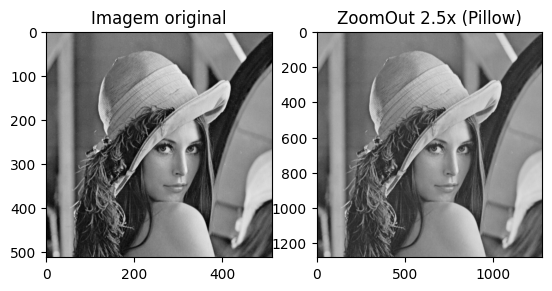

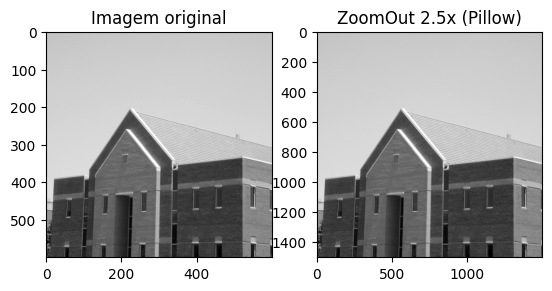

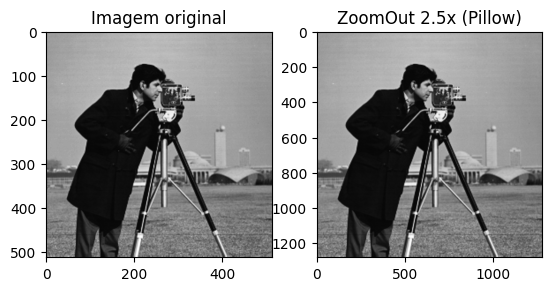

In [123]:
for img in images:
  imgNew = escalaOpenCV(img, 2/3)
  plot(img,imgNew,"ZoomIn 1.5x (Pillow)")

for img in images:
  imgNew = escalaOpenCV(img, 2.5)
  plot(img,imgNew,"ZoomOut 2.5x (Pillow)")

#####Escala usando Scipy

In [124]:
def escalaScipy(img, escala):
    # Zoom usando Scipy
    npImage = np.array(img)

    lin, col = npImage.shape
    scaled_npImage = scipy.ndimage.zoom(npImage, (escala, escala))

    imgNew = Image.fromarray(np.uint8(scaled_npImage))
    return imgNew

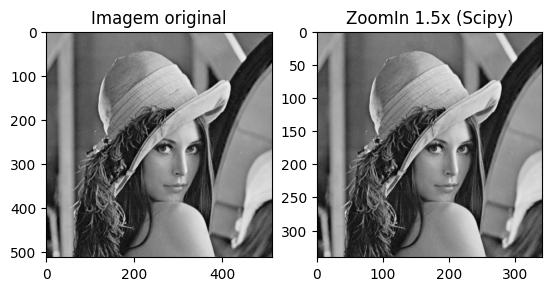

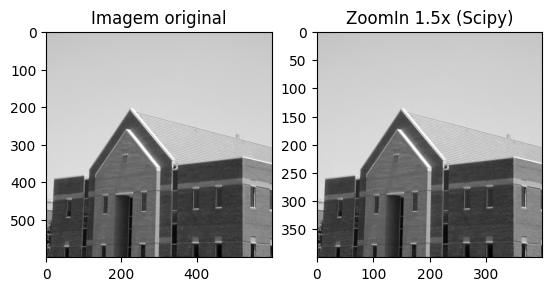

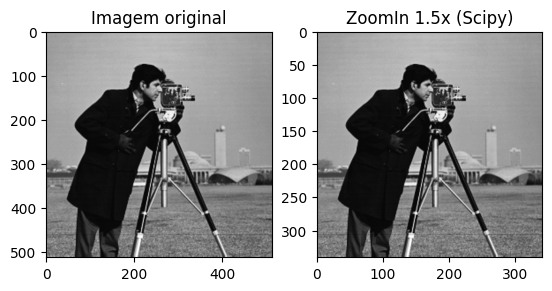

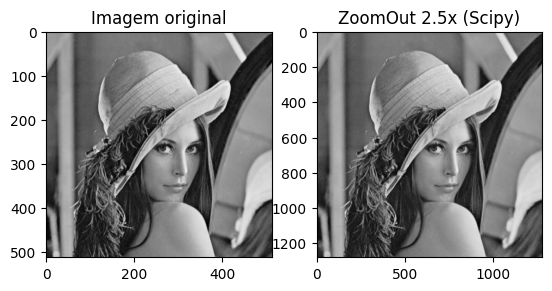

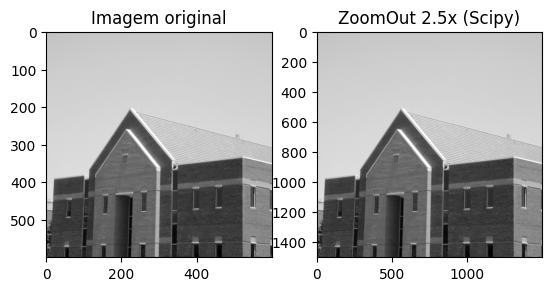

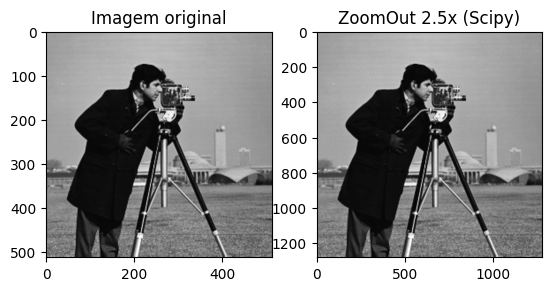

In [125]:
for img in images:
  imgNew = escalaScipy(img, 2/3)
  plot(img,imgNew,"ZoomIn 1.5x (Scipy)")

for img in images:
  imgNew = escalaScipy(img, 2.5)
  plot(img,imgNew,"ZoomOut 2.5x (Scipy)")

---


#### 3.2 - Rotação em 45º, 90º e 100º;

#####Rotação Numpy

In [126]:
def rotacaoNumpy(img, grau):
    npImage = np.array(img)
    lin, col = npImage.shape[:2]

    rad = np.deg2rad(grau)
    cos_theta = np.cos(rad)
    sin_theta = np.sin(rad)

    rotation_matrix = np.array([[cos_theta, -sin_theta],
                                [sin_theta,  cos_theta]])

    center_y, center_x = lin // 2, col // 2
    output_image = np.full_like(npImage, 128)

    for i in range(lin):
        for j in range(col):
            y_rel, x_rel = i - center_y, j - center_x

            src_coords = np.dot(rotation_matrix.T, np.array([x_rel, y_rel]))

            src_x = int(src_coords[0] + center_x)
            src_y = int(src_coords[1] + center_y)

            if 0 <= src_x < col and 0 <= src_y < lin:
                output_image[i, j] = npImage[src_y, src_x]

    image_out = Image.fromarray(output_image.astype(npImage.dtype))

    return image_out

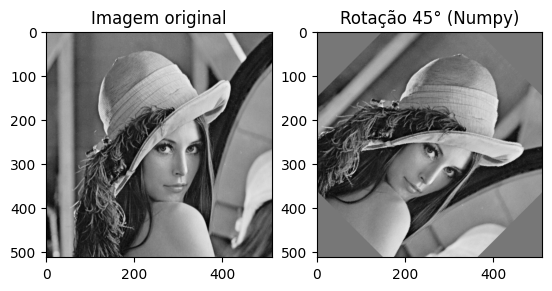

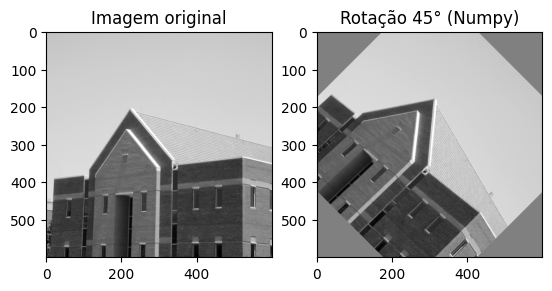

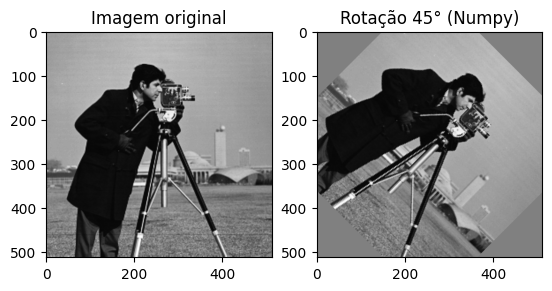

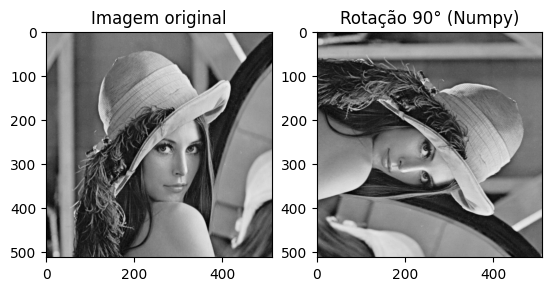

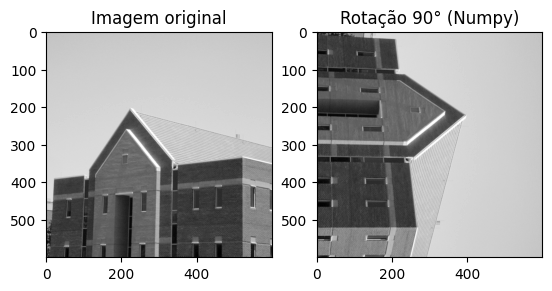

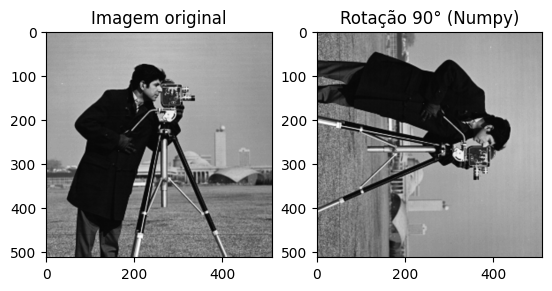

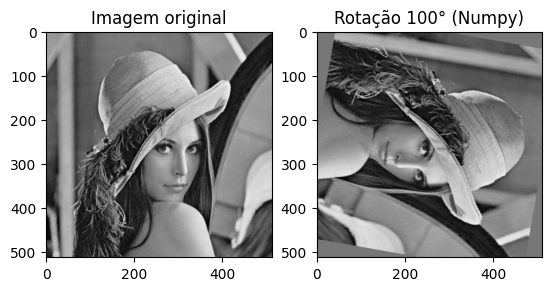

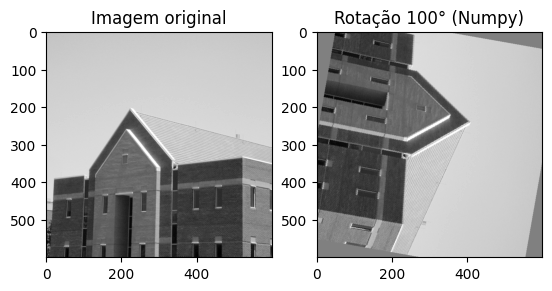

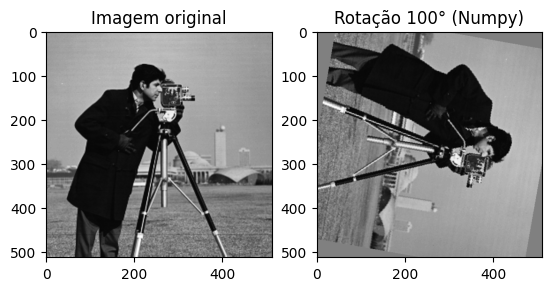

In [127]:
for img in images:
  imgNew = rotacaoNumpy(img, 45)
  plot(img,imgNew,"Rotação 45\u00b0 (Numpy)")

for img in images:
  imgNew = rotacaoNumpy(img, 90)
  plot(img,imgNew,"Rotação 90\u00b0 (Numpy)")

for img in images:
  imgNew = rotacaoNumpy(img, 100)
  plot(img,imgNew,"Rotação 100\u00b0 (Numpy)")

#####Rotação Pillow

In [128]:
def rotacaoPillow(img, grau):
    image_rotate = img.rotate(grau*-1, resample=Image.BICUBIC, fillcolor=128)
    return image_rotate

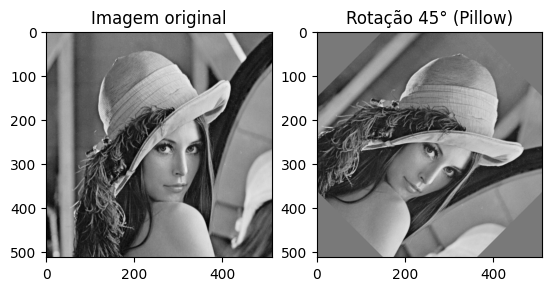

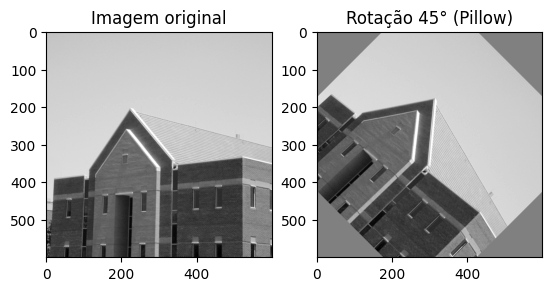

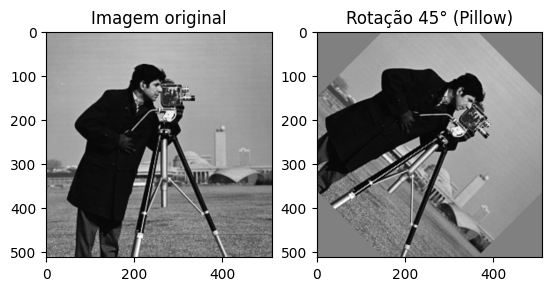

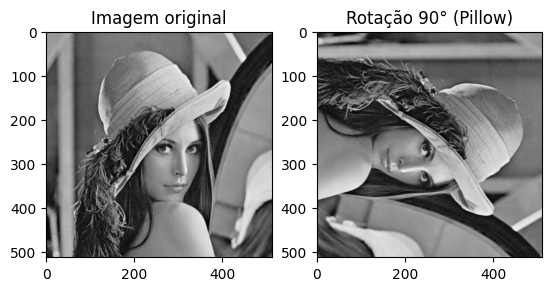

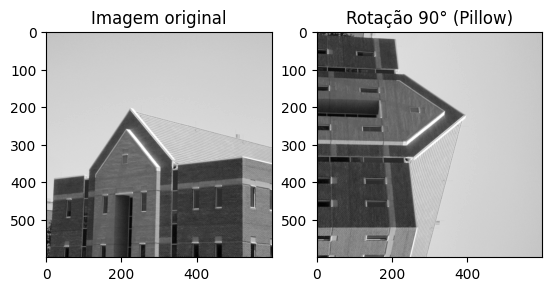

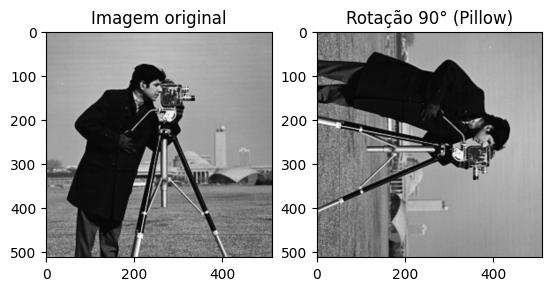

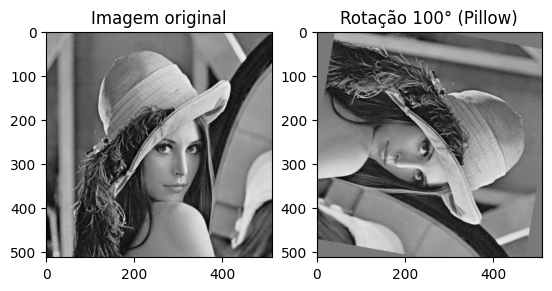

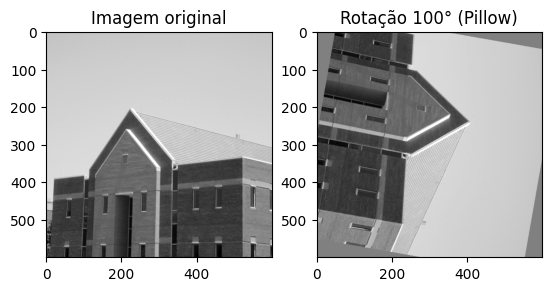

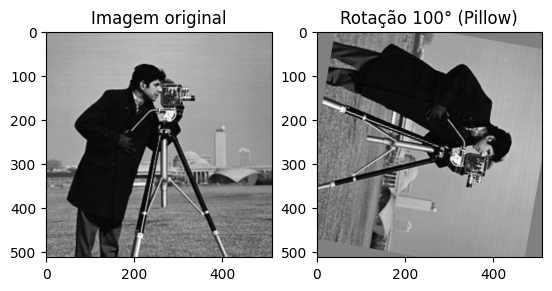

In [129]:
for img in images:
  imgNew = rotacaoPillow(img, 45)
  plot(img,imgNew,"Rotação 45\u00b0 (Pillow)")

for img in images:
  imgNew = rotacaoPillow(img, 90)
  plot(img,imgNew,"Rotação 90\u00b0 (Pillow)")

for img in images:
  imgNew = rotacaoPillow(img, 100)
  plot(img,imgNew,"Rotação 100\u00b0 (Pillow)")

#####Rotação OpenCV

In [130]:
def rotacaoOpenCV(img, grau):
    npImage = np.array(img)
    h, w = npImage.shape[:2]

    center = (w // 2, h // 2)
    rotation_matrix = cv.getRotationMatrix2D(center, grau * -1, 1.0)
    npImageRotate = cv.warpAffine(npImage, rotation_matrix, (w, h),
                                   borderMode=cv.BORDER_CONSTANT, borderValue=(128, 128, 128))

    image_out = Image.fromarray(npImageRotate)

    return image_out

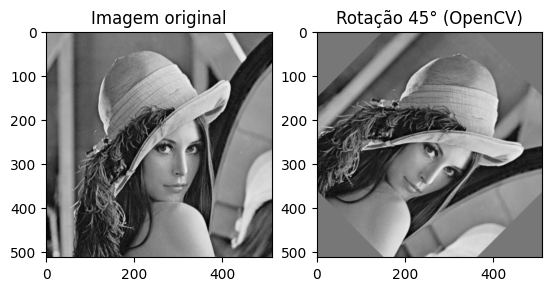

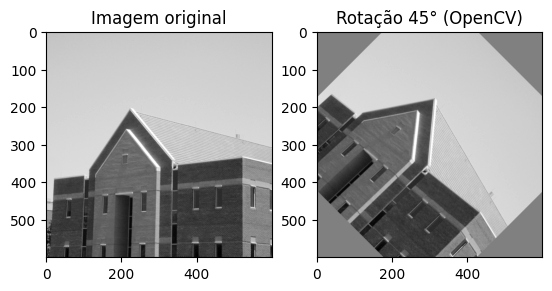

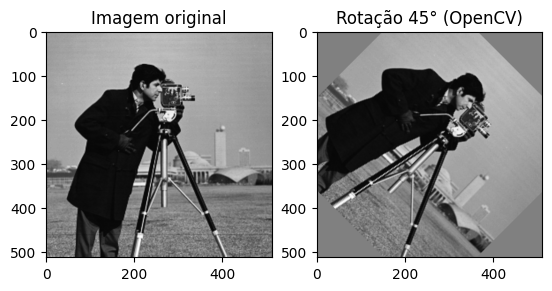

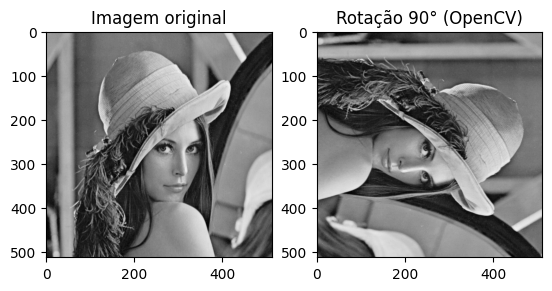

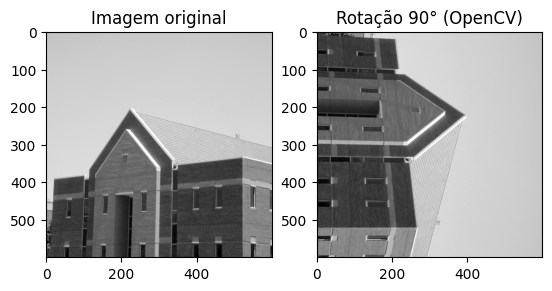

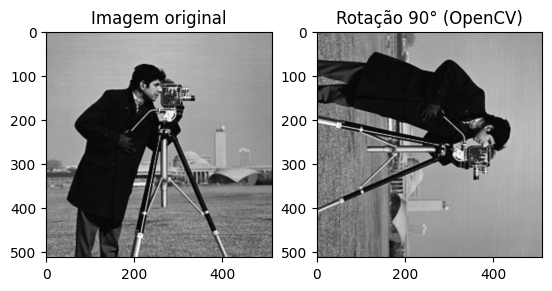

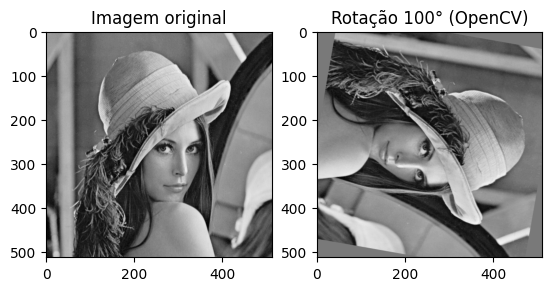

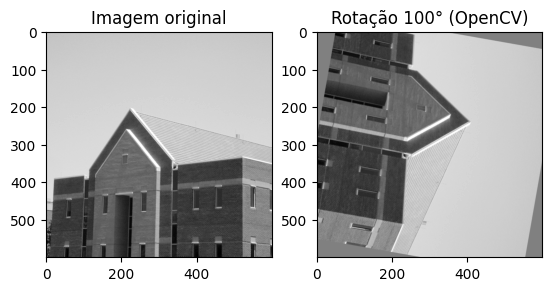

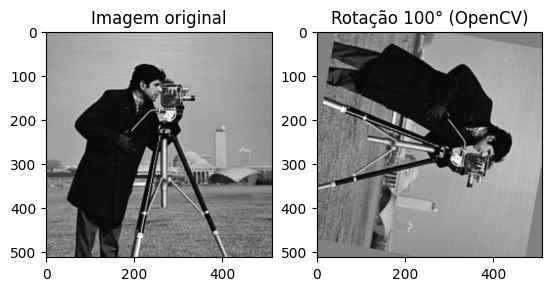

In [131]:
for img in images:
  imgNew = rotacaoOpenCV(img, 45)
  plot(img,imgNew,"Rotação 45\u00b0 (OpenCV)")

for img in images:
  imgNew = rotacaoOpenCV(img, 90)
  plot(img,imgNew,"Rotação 90\u00b0 (OpenCV)")

for img in images:
  imgNew = rotacaoOpenCV(img, 100)
  plot(img,imgNew,"Rotação 100\u00b0 (OpenCV)")

#####Rotação Scipy

In [132]:
def rotacaoScipy(img, grau):
  npImage = np.array(img)
  npImageRotate  = scipy.ndimage.rotate(npImage, grau*-1, cval=128)
  image_out = Image.fromarray(npImageRotate)
  return image_out

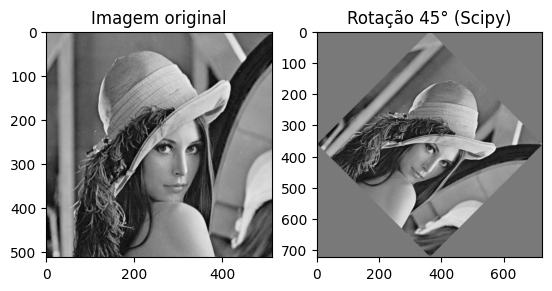

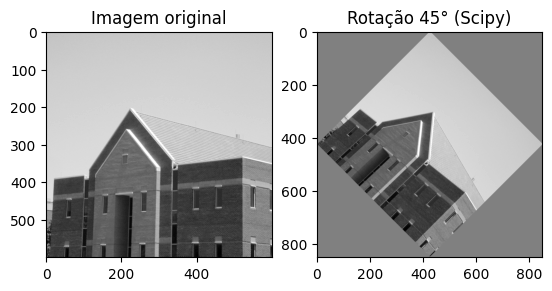

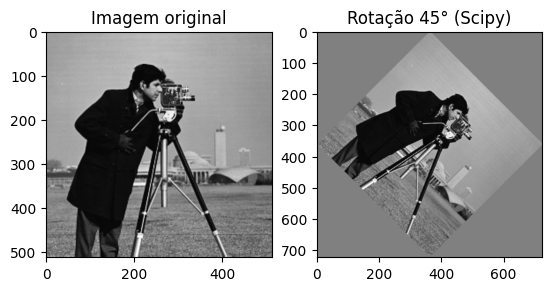

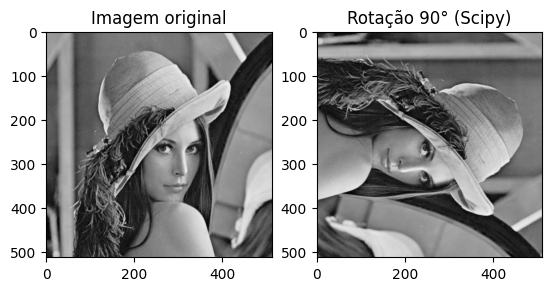

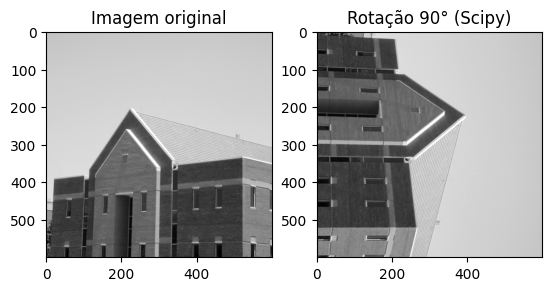

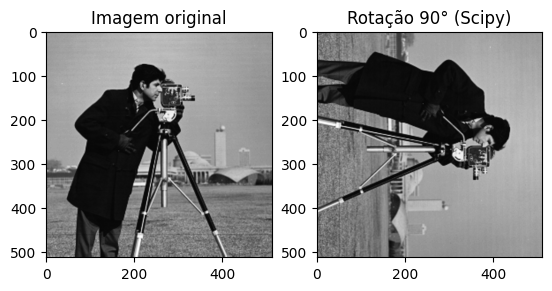

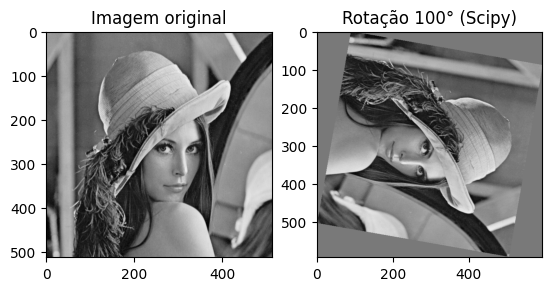

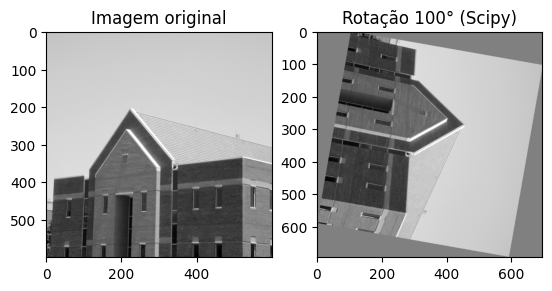

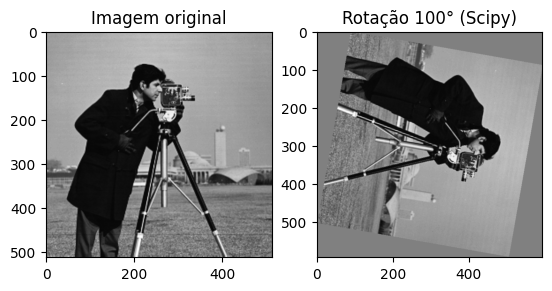

In [133]:
for img in images:
  imgNew = rotacaoScipy(img, 45)
  plot(img,imgNew,"Rotação 45\u00b0 (Scipy)")

for img in images:
  imgNew = rotacaoScipy(img, 90)
  plot(img,imgNew,"Rotação 90\u00b0 (Scipy)")

for img in images:
  imgNew = rotacaoScipy(img, 100)
  plot(img,imgNew,"Rotação 100\u00b0 (Scipy)")

---


#### 3.3 - Translação utilizar os parâmetros que quiser nas coordenadas x e y;

#####Translação Numpy

In [134]:
def translacaoNumpy(img, x, y):
    npImage = np.array(img)
    height, width = npImage.shape[:2]

    image_np_new = np.full((height, width), 128, dtype=npImage.dtype)
    for i in range(height):
        for j in range(width):
            new_i = i + y*-1
            new_j = j + x

            if 0 <= new_i < height and 0 <= new_j < width:
                image_np_new[new_i, new_j] = npImage[i, j]

    image_out = Image.fromarray(image_np_new)

    return image_out


Valor X: 30
Valor Y: 80


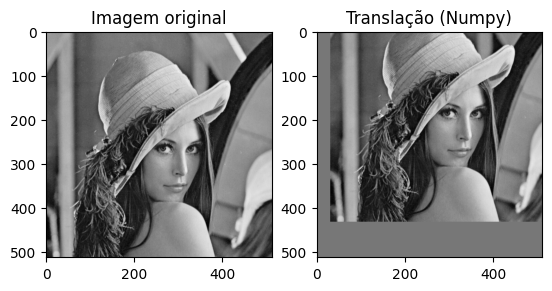

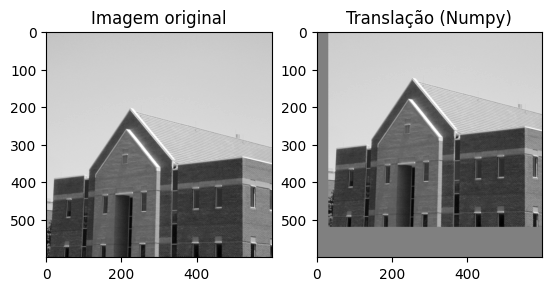

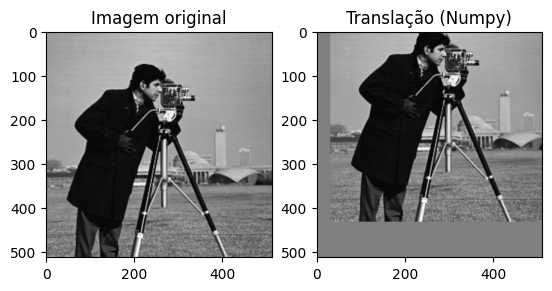

In [135]:
x = input('Valor X: ')
y = input('Valor Y: ')
for img in images:
  imgNew = translacaoNumpy(img, int(x), int(y))
  plot(img,imgNew,"Translação (Numpy)")

#####Translação Pillow

In [136]:
def translacaoPillow(img, x, y):
  translation_matrix = (1, 0, x*-1, 0, 1, y)

  image_out = img.transform(img.size, Image.AFFINE, translation_matrix, fillcolor=128)

  return image_out

Valor X: 30
Valor Y: 80


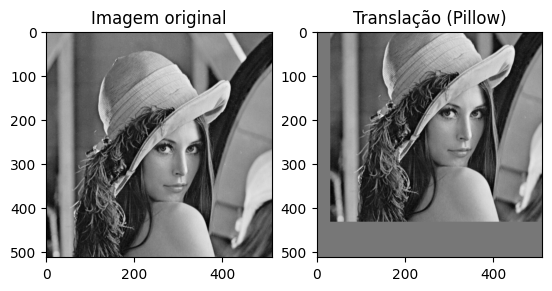

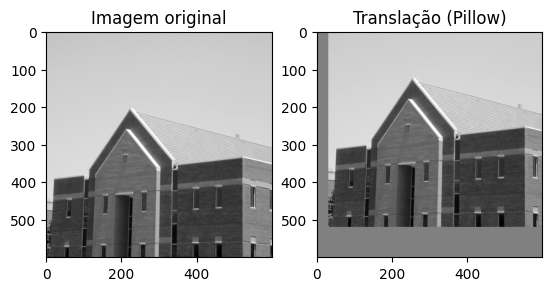

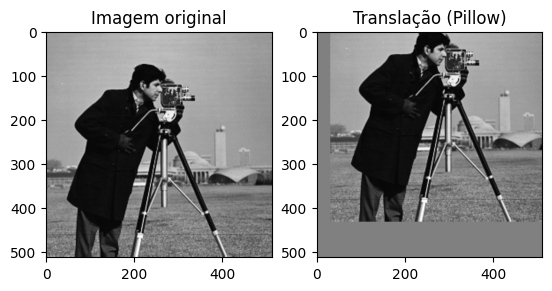

In [137]:
x = input('Valor X: ')
y = input('Valor Y: ')
for img in images:
  imgNew = translacaoPillow(img, int(x), int(y))
  plot(img,imgNew,"Translação (Pillow)")

#####Translação OpenCV

In [138]:
def translacaoOpenCV(img, x, y):
    npImage = np.array(img)
    height, width = npImage.shape[:2]

    translation_matrix = np.array([[1, 0, x],
                                   [0, 1, y*-1]], dtype=float)

    image_np_new = cv.warpAffine(npImage, translation_matrix, (width, height),
                                  borderMode=cv.BORDER_CONSTANT, borderValue=128)

    image_out = Image.fromarray(image_np_new)
    return image_out

Valor X: 30
Valor Y: 80


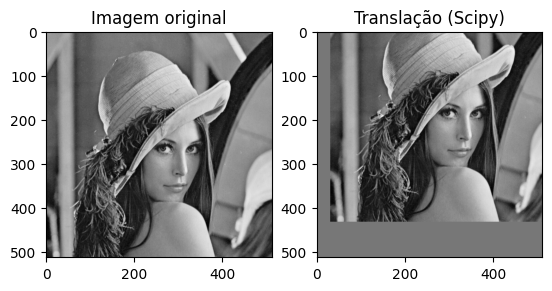

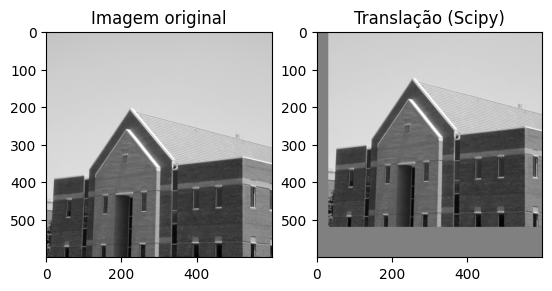

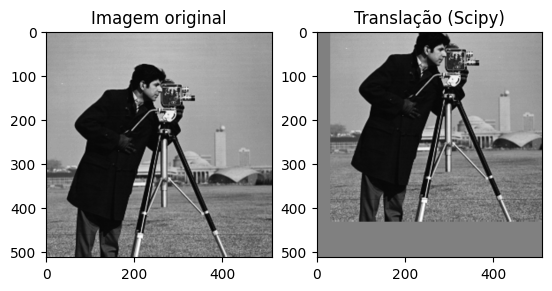

In [139]:
x = input('Valor X: ')
y = input('Valor Y: ')
for img in images:
  imgNew = translacaoOpenCV(img, int(x), int(y))
  plot(img,imgNew,"Translação (Scipy)")

#####Translação Scipy

In [140]:
def translacaoScipy(img, x,y):
  npImage = np.array(img)
  height, width = npImage.shape[:2]

  transform = np.array([[1, 0, y],
                        [0, 1, x*-1]])
  image_np_new = scipy.ndimage.affine_transform(npImage, transform,
                                                offset=(0, 0),
                                                output_shape=(height, width),
                                                cval=128)
  image_out = Image.fromarray(image_np_new)
  return image_out

Valor X: 30
Valor Y: 80


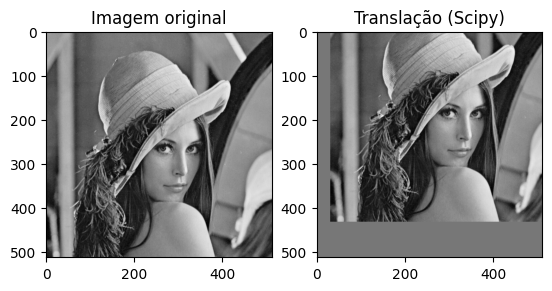

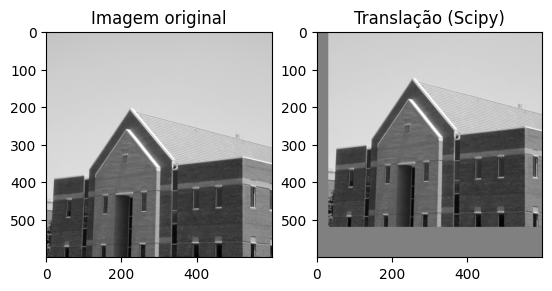

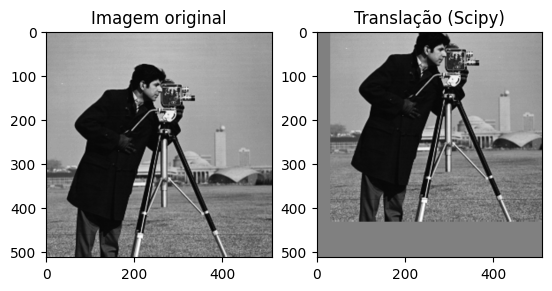

In [141]:
x = input('Valor X: ')
y = input('Valor Y: ')
for img in images:
  imgNew = translacaoScipy(img, int(x), int(y))
  plot(img,imgNew,"Translação (Scipy)")

---


#### 3.4 - Translação em 35 pixel no eixo X, 45 eixo Y;

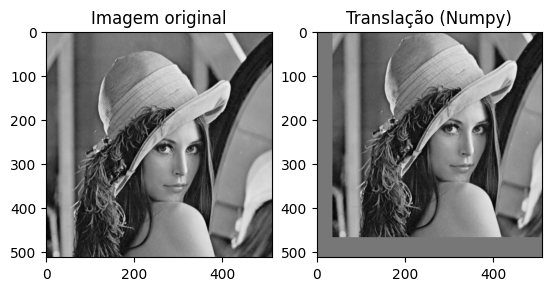

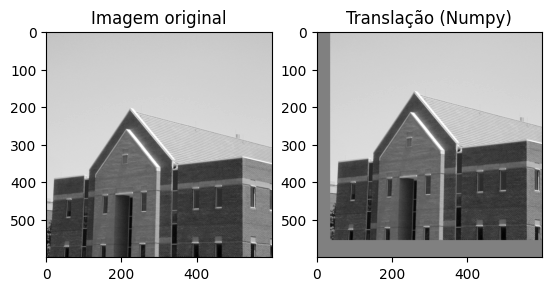

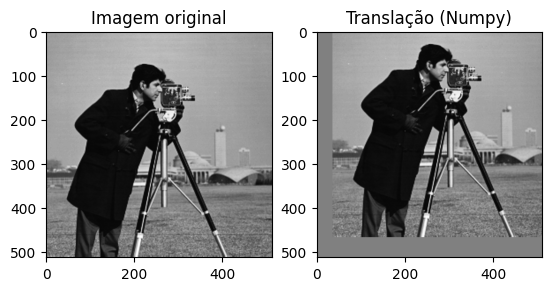

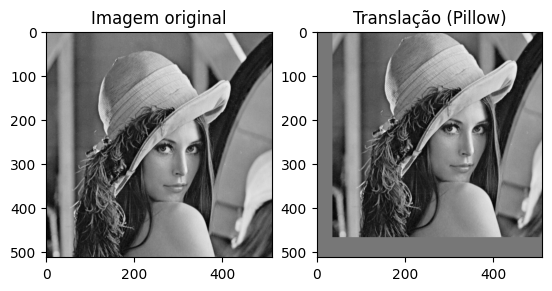

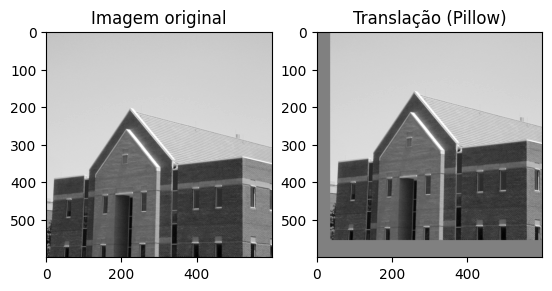

...

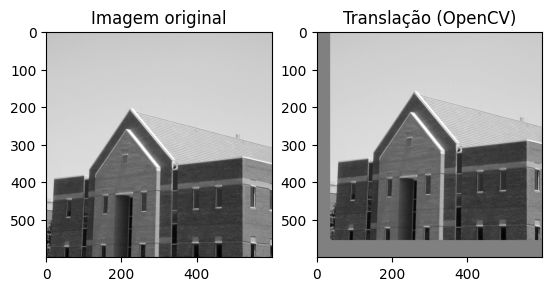

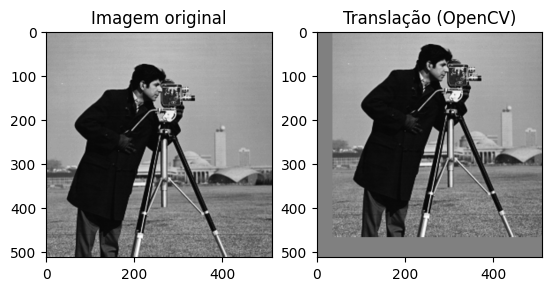

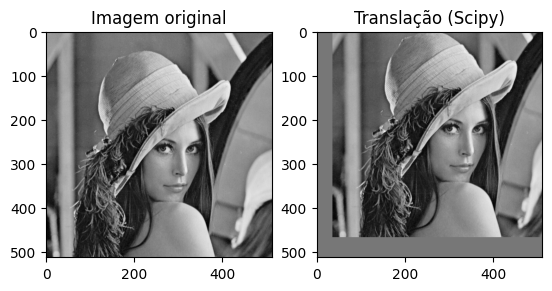

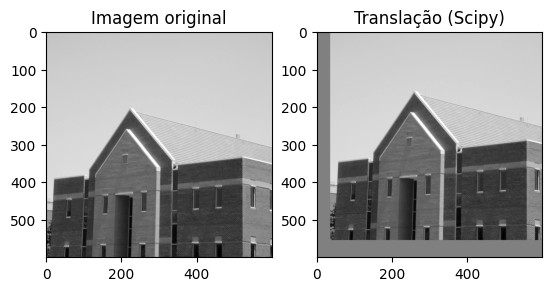

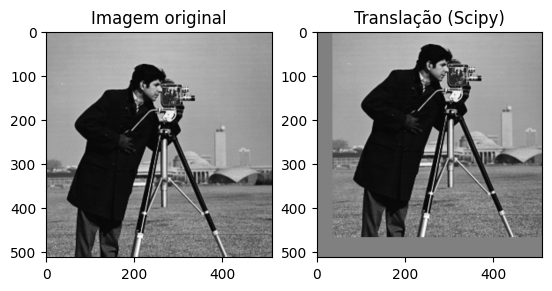

In [142]:
for img in images:
  imgNew = translacaoNumpy(img, 35, 45)
  plot(img,imgNew,"Translação (Numpy)")

for img in images:
  imgNew = translacaoPillow(img, 35, 45)
  plot(img,imgNew,"Translação (Pillow)")

for img in images:
  imgNew = translacaoOpenCV(img, 35, 45)
  plot(img,imgNew,"Translação (OpenCV)")

for img in images:
  imgNew = translacaoScipy(img, 35, 45)
  plot(img,imgNew,"Translação (Scipy)")